In [1]:
import torch
import torchvision.transforms as transforms
from torchvision.utils import make_grid

import requests
import numpy as np
from PIL import Image

import cv2
import matplotlib.pyplot as plt

device = torch.device("mps")

In [2]:


def visualise_generator(img, transform):
    # apply transformation to images
    imgs = [transform(img) for _ in range(4)]
    imgs = torch.stack(imgs)
    # make grid 
    grid = make_grid(imgs, nrow=2)
    # convert to numpy
    grid_np = grid.numpy().transpose(1,2,0)
    grid_np = (grid_np * 255).astype(np.uint8)
    # matplotlib for plotting
    plt.figure(figsize=(15, 15))
    plt.axis("off")
    plt.imshow(grid_np)
    plt.show()

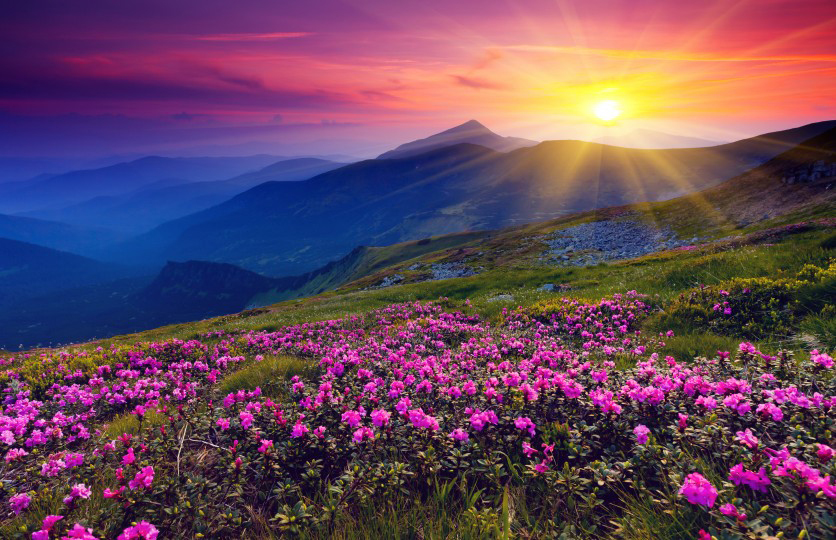

In [3]:
img = Image.open("../../misc/other_misc_imgs/landscape.jpg")
display(img)

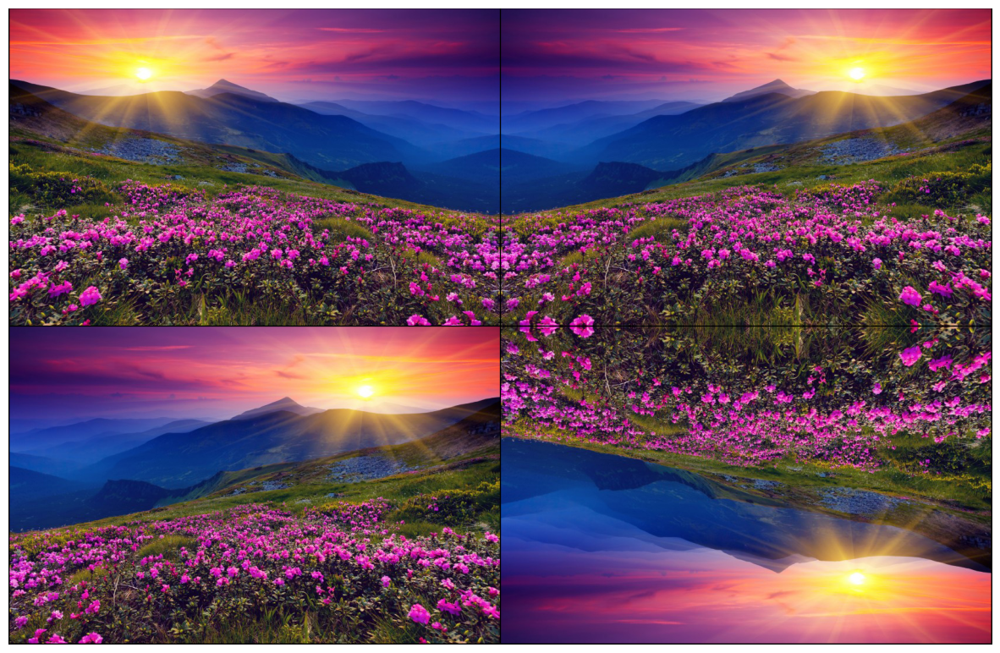

In [4]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor()
])

visualise_generator(img, transform)

### Affine Transformation
- Type of mapping or function that preserves points, straights lines, and planes
- It includes a combination of linear transformations (such as scaling, rotation, and shearing) and translations (shifting).
    - degrees: Specifies the maximum rotation angle in degrees.
    - translate: Tuple specifying maximum translation in both horizontal and vertical directions. Values are proportions of the image size.
    - scale: Tuple specifying the range for scaling. A scale of (0.8, 1.2) means the image can be scaled down to 80% or up to 120% of its original size.
    - shear: Specifies the maximum shear angle in degrees.

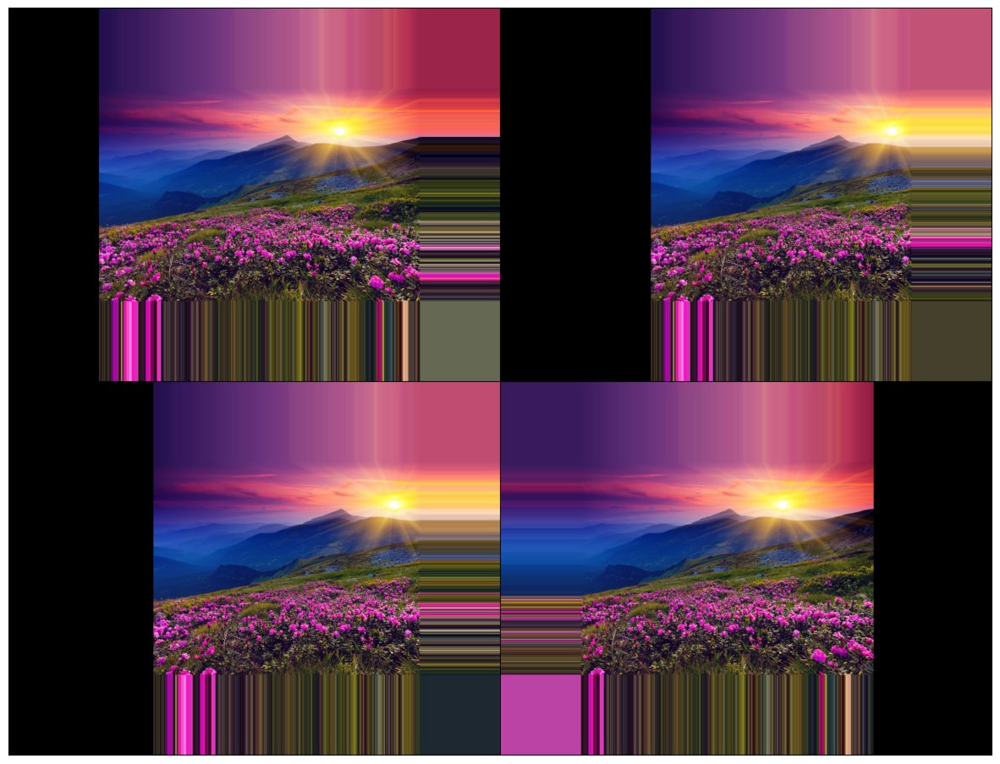

In [5]:
transform = transforms.Compose([
    transforms.RandomAffine(degrees=0, translate=(0.5,0)),
    transforms.Pad(padding=200, fill=0, padding_mode="edge"),
    transforms.ToTensor()
])

visualise_generator(img, transform)

### Brightness

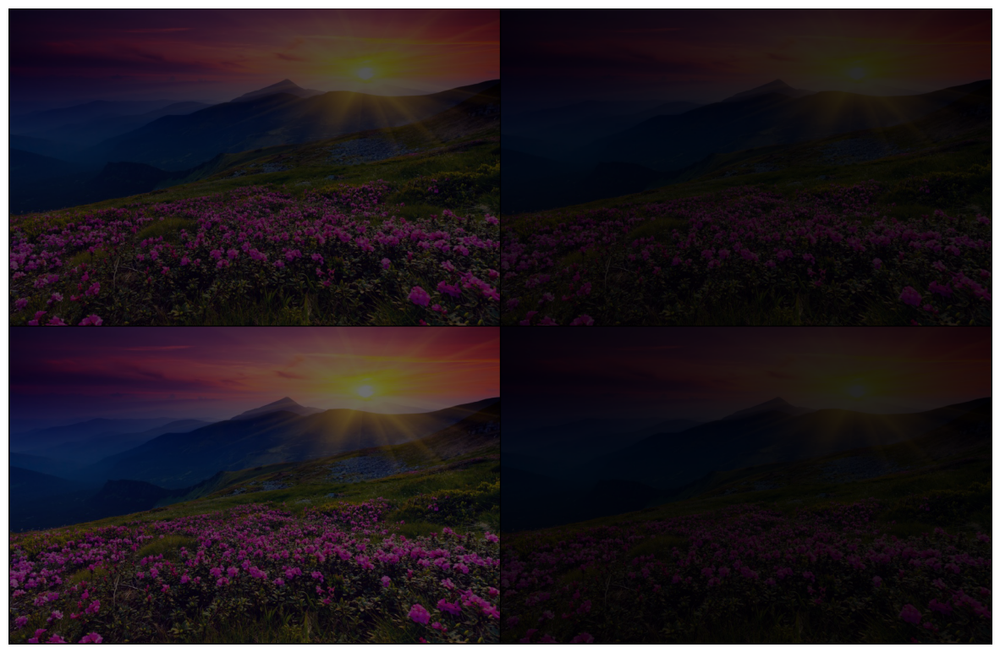

In [6]:
transform = transforms.Compose([
    transforms.ColorJitter(brightness=(0,1)),
    transforms.ToTensor()
])

visualise_generator(img, transform)

### Shearing
- Max shear angle in degrees

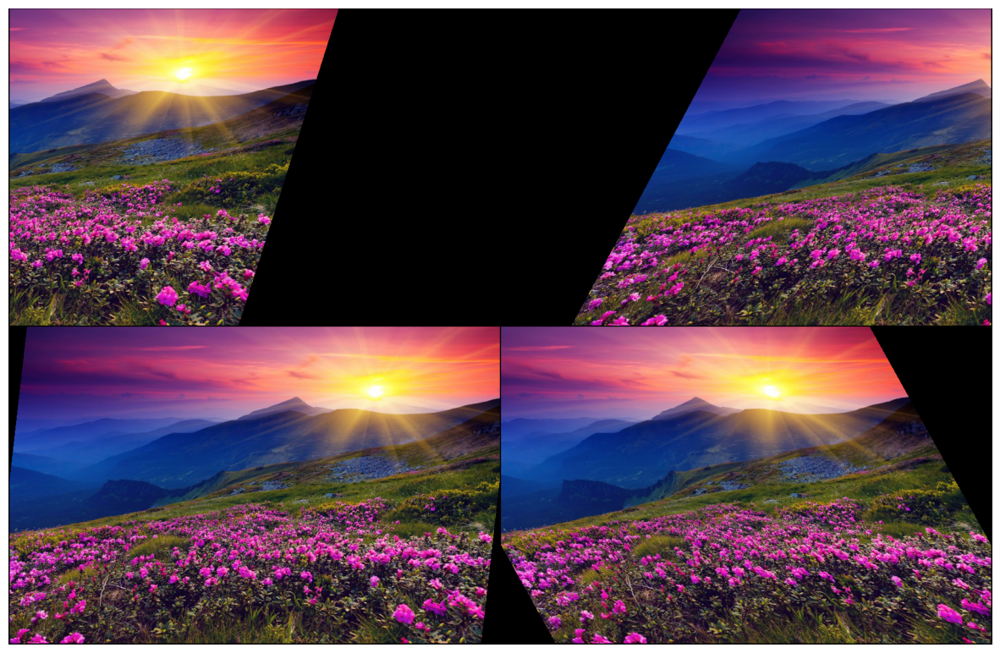

In [7]:
transform = transforms.Compose([
    transforms.RandomAffine(degrees=0, translate=(0.5,0), shear=30),
    transforms.ToTensor()
])

visualise_generator(img, transform)

### Rotating

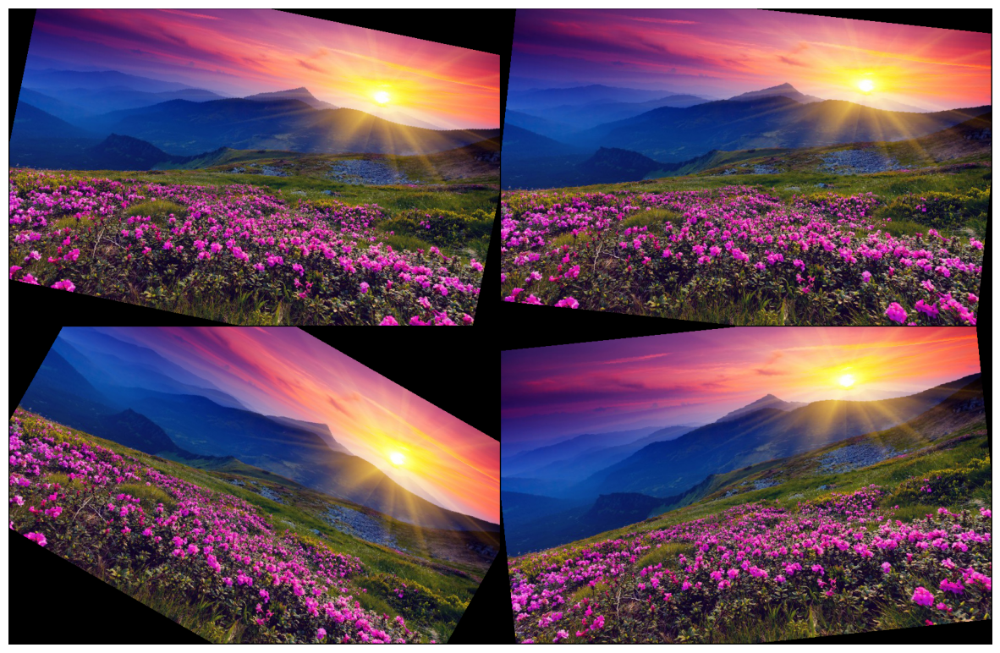

In [8]:
transform = transforms.Compose([
    transforms.RandomAffine(degrees=30),
    transforms.ToTensor()
])

visualise_generator(img, transform)